In [28]:
import numpy as np
import cv2
import glob
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
# %matplotlib qt

import pickle
%matplotlib inline


nx = 9
ny = 6

In [2]:
def get_obj_and_img_points_from_calibration_images():
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((ny*nx,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob('camera_cal/calibration*.jpg')

    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            #write_name = 'corners_found'+str(idx)+'.jpg'
            #cv2.imwrite(write_name, img)
            cv2.imshow('img', img)
            cv2.waitKey(500)
        else:
            print("no corner found")

    cv2.destroyAllWindows()
    return objpoints, imgpoints

# objpoints, imgpoints = get_obj_and_img_points_from_calibration_images()

In [3]:
def calibrate_image(objpoints, imgpoints):
    # Test undistortion on an image
    img = cv2.imread('camera_cal/calibration5.jpg')
    img_size = (img.shape[1], img.shape[0])

    # Do camera calibration given object points and image points
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


    dst = cv2.undistort(img, mtx, dist, None, mtx)
    cv2.imwrite('camera_cal/calibration5_undist.jpg',dst)

    # Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
    #dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)
    
    return mtx, dist
    
# mtx, dist = calibrate_image(objpoints, imgpoints)

In [4]:
# Camera calibration tests

# import numpy as np
# import cv2
# import glob
# import matplotlib.pyplot as plt
# import matplotlib.image as mpimg

# # prepare object points
# nx = 9
# ny = 6

# # Make a list of calibration images
# fname = 'camera_cal/calibration3.jpg'
# img = cv2.imread(fname)

# plt.imshow(img)
# plt.show()

# # Convert to grayscale
# gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# # Find the chessboard corners
# ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

# # If found, draw corners
# if ret == True:
#     # Draw and display the corners
#     cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
#     plt.imshow(img)
#     plt.show()
    
    
#     # Read in the saved objpoints and imgpoints
# dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
# objpoints = dist_pickle["objpoints"]
# imgpoints = dist_pickle["imgpoints"]

# # Read in an image
# img = cv2.imread('camera_cal/calibration5.jpg')

# # TODO: Write a function that takes an image, object points, and image points
# # performs the camera calibration, image distortion correction and 
# # returns the undistorted image
# def cal_undistort(img, objpoints, imgpoints):
#     # Use cv2.calibrateCamera and cv2.undistort()
#     gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
#     ret, corners = cv2.findChessboardCorners(gray, gray.shape[::-1],None)
#     img = cv2.drawChessboardCorners(img, gray.shape[::-1], corners, ret)
#     ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
#     dst = cv2.undistort(img, mtx, dist, None, mtx)
#     return dst

# undistorted = cal_undistort(img, objpoints, imgpoints)

# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(img)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(undistorted)
# ax2.set_title('Undistorted Image', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)





In [5]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    M = None
    warped = np.copy(img)
    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 80 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
    else:
        print("No corner found")
    # Return the resulting image and matrix
    return warped, M

[[  1.15590104e+03   0.00000000e+00   6.52751638e+02]
 [  0.00000000e+00   1.14731911e+03   3.92429943e+02]
 [  0.00000000e+00   0.00000000e+00   1.00000000e+00]]
[[ -2.29043264e-01   4.53259886e-01  -5.19436686e-04  -3.63779196e-03
   -1.14322687e+00]]


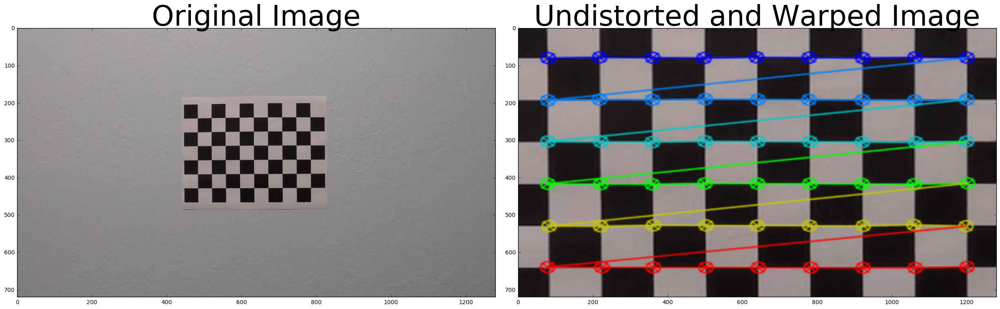

In [6]:
dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

print(mtx)
print(dist)

img = cv2.imread('camera_cal/calibration6.jpg')
top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(top_down)
ax2.set_title('Undistorted and Warped Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [7]:
# Define a function that takes an image, gradient orientation,
# and threshold min / max values.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Apply x or y gradient with the OpenCV Sobel() function
    # and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    # Return the result
    return binary_output

# Define a function to return the magnitude of the gradient
# for a given sobel kernel size and threshold values
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Take both Sobel x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # Rescale to 8 bit
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8) 
    # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1

    # Return the binary image
    return binary_output

# Define a function to threshold an image for a given range and Sobel kernel
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, s
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output


# Define a function that thresholds the S-channel of HLS
def hls_select(img, thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    return binary_output


# image = mpimg.imread('test_images/test1.jpg')

# # Run the function
# # grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# # mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# # dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# #ksize = 3

# ksize = 9
# sobelx_thresh = (20, 80)
# sobely_thresh = (20, 80)
# mag_grad_thresh = (30, 100)
# dir_grad_thresh = (0.7, 1.3)



# gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 80))
# grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 80))
# mag_binary = mag_thresh(image, sobel_kernel=ksize, mag_thresh=(30, 100))
# dir_binary = dir_threshold(image, sobel_kernel=ksize, thresh=(0.7, 1.3))

# combined = np.zeros_like(dir_binary)
# combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
# # hls_binary = hls_select(image, thresh=(0, 50))
# # result = pipeline(image)

# # Plot the result
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(combined, cmap='gray')
# ax2.set_title('Combined', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [8]:
# # Pipeline Image:

# # Edit this function to create your own pipeline.
# def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
#     img = np.copy(img)
#     # Convert to HSV color space and separate the V channel
#     hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
#     l_channel = hsv[:,:,1]
#     s_channel = hsv[:,:,2]
#     # Sobel x
#     sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
#     abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
#     scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
#     # Threshold x gradient
#     sxbinary = np.zeros_like(scaled_sobel)
#     sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
#     # Threshold color channel
#     s_binary = np.zeros_like(s_channel)
#     s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
#     # Stack each channel
#     # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
#     # be beneficial to replace this channel with something else.
#     color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary))
#     return color_binary
    
# image = mpimg.imread('test_images/test1.jpg')

# # Run the function
# # grad_binary = abs_sobel_thresh(image, orient='x', thresh_min=20, thresh_max=100)
# # mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(30, 100))
# # dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))

# ksize = 3

# hls_binary = hls_select(image, thresh=(0, 50))
# result = pipeline(image)

# # Plot the result
# f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
# f.tight_layout()
# ax1.imshow(image)
# ax1.set_title('Original Image', fontsize=50)
# ax2.imshow(result, cmap='gray')
# ax2.set_title('Pipeline', fontsize=50)
# plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [46]:
#Full Pipeline
def get_binary_warped(undistorted, ksize):
    gradx = abs_sobel_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 80))
    grady = abs_sobel_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(20, 80))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 100))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.7, 1.3))

    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1



    # color_binary = pipeline(undistorted)
    hls_binary = hls_select(img, thresh=(0, 50))

    # top_down, perspective_M = corners_unwarp(img, nx, ny, mtx, dist)
    # warped = cv2.warpPerspective(img, perspective_M, img.shape[1::-1], flags=cv2.INTER_LINEAR)

    # define 4 source points for perspective transformation
    # src = np.float32([[220,719],[1220,719],[750,480],[550,480]])
    # # define 4 destination points for perspective transformation
    # dst = np.float32([[240,719],[1040,719],[1040,300],[240,300]])

    img_size = combined.shape[1::-1]

#     print(combined.shape)
#     print(img_size)
#     print(img.shape)

    src = np.float32(
        [[(img_size[0] / 2) - 40, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 30), img_size[1]],
        [(img_size[0] * 5 / 6) + 150, img_size[1]],
        [(img_size[0] / 2 + 120), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])

    print(np.array(src, dtype=np.int32))
    print(src.shape)

#     cv2.polylines(undistorted, [np.array(src, dtype=np.int32)] ,True,(0,255,255))

    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    warped = cv2.warpPerspective(combined, M, img_size, flags=cv2.INTER_LINEAR)

#     cv2.polylines(warped, [np.array(dst, dtype=np.int32)] ,True,(255,255,255))
    
    return warped, Minv


In [60]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def find_poly_fit_using_histogram(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 9
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    return left_fit, right_fit, out_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx_base, rightx_base


In [49]:
def generate_plotting_values(binary_warped, left_fit, right_fit):
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    return left_fitx, right_fitx, ploty
   

In [12]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

NameError: name 'binary_warped' is not defined

In [ ]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [ ]:
# import numpy as np
# import matplotlib.pyplot as plt
# # Generate some fake data to represent lane-line pixels
# ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
# quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# # For each y position generate random x position within +/-50 pix
# # of the line base position in each case (x=200 for left, and x=900 for right)
# leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
#                               for y in ploty])
# rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
#                                 for y in ploty])

# leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
# rightx = rightx[::-1]  # Reverse to match top-to-bottom in y







# # # Fit a second order polynomial to pixel positions in each fake lane line
# left_fit = np.polyfit(ploty, leftx, 2)
# left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
# right_fit = np.polyfit(ploty, rightx, 2)
# right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# # Plot up the fake data
# mark_size = 3
# plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
# plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
# plt.xlim(0, 1280)
# plt.ylim(0, 720)
# plt.plot(left_fitx, ploty, color='green', linewidth=3)
# plt.plot(right_fitx, ploty, color='green', linewidth=3)
# plt.gca().invert_yaxis() # to visualize as we do the images

In [13]:
def get_radius_of_curvature(ploty, left_fit, right_fit):
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    print(left_curverad, right_curverad)
    # Example values: 1926.74 1908.48
    
    return left_curverad, right_curverad

In [14]:
def get_radius_of_curvature_in_meters(ploty, left_fitx, right_fitx):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    print(ploty.shape, left_fitx.shape, right_fitx.shape)

    
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters

    # Example values: 632.1 m    626.2 m
    return left_curverad, right_curverad

In [15]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

In [81]:
def draw_lane_zone(img, undist, binary_warped, ploty, left_fitx, right_fitx, Minv):
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (img.shape[1], img.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    # result = cv2.addWeighted(img, 1, newwarp, 0.3, 0)
#     plt.imshow(result)
    
    return result

In [62]:
def get_offset(width, leftx_base, rightx_base):
    lane_center = (leftx_base + rightx_base) / 2
    diff_pix = width/2 - lane_center
    xm_per_pix = 3.5/1000
    offset_m = diff_pix * xm_per_pix
    return offset_m

In [83]:
def annotate(img, left_curverad, right_curverad, offset_m):
    font = cv2.FONT_HERSHEY_COMPLEX_SMALL
    cv2.putText(img, 'Left Radius of Curvature: {0:2f} meters'.format(left_curverad), (10,30), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Right Radius of Curvature: {0:2f} meters'.format(right_curverad),(10,60), font, 1, (255,255,255), 2)
    cv2.putText(img, 'Vehicle Position Offset: {0:2f} meters'.format(offset_m), (10,90), font, 1, (255,255,255), 2)
#     cv2.putText(img,'Hello World!',(10,500), font, 1,(255,255,255),2)

[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
2484.71311095 m 3320.54043675 m 0.76125 m


C:\Program Files\Anaconda3\lib\site-packages\ipykernel\__main__.py:8: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
2043.61754908 m 27749.0239645 m 0.18375 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
1662.14458235 m 799.913644702 m 0.6475 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
750.124049112 m 748.0424581 m 0.112 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
1686.02039631 m 1667.63559406 m 0.04375 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
434.407446445 m 557.01506169 m 0.56525 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
8354.57493163 m 573.157621662 m 0.18725 m
[[ 600  460]
 [ 183  720]
 [1216  720]
 [ 760  460]]
(4, 2)
(720,) (720,) (720,)
1369.17055366 m 166.899808556 m -0.0105 m


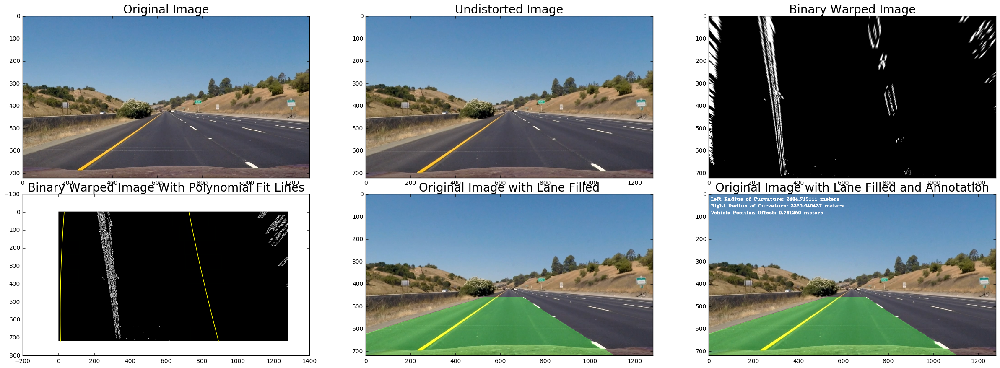

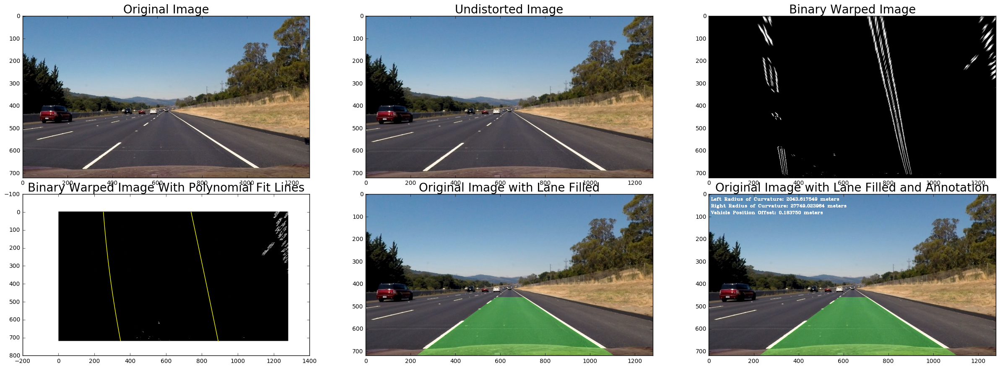

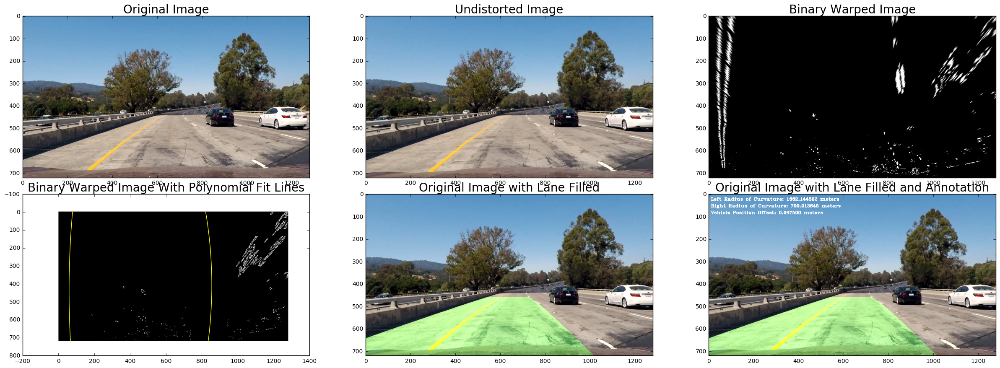

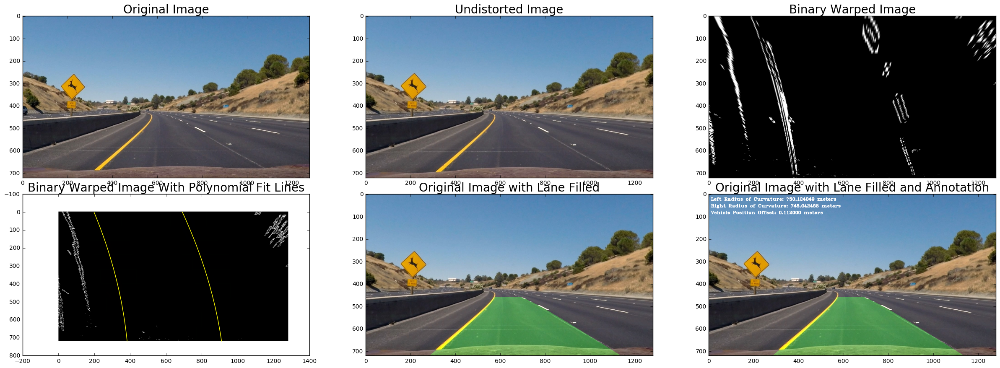

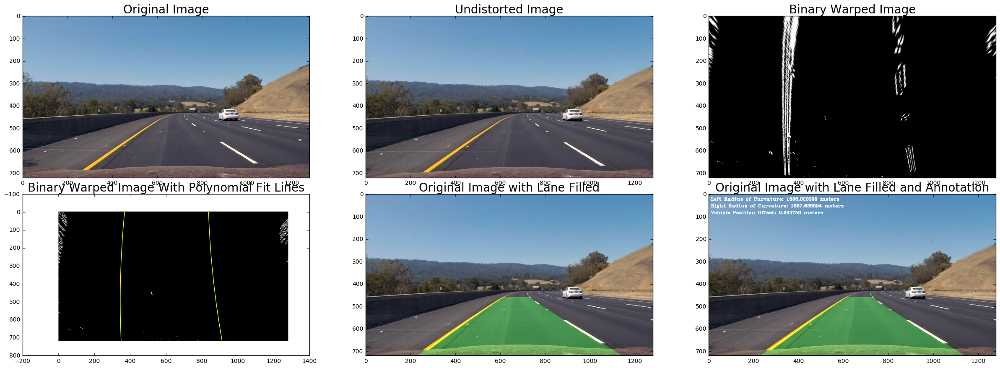

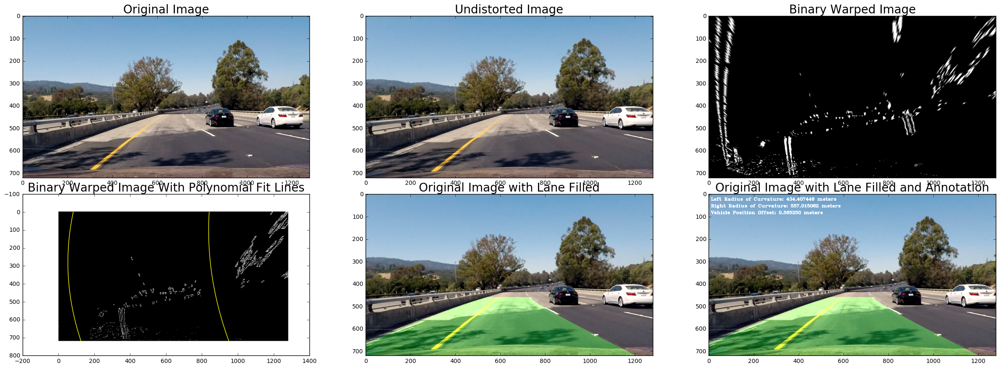

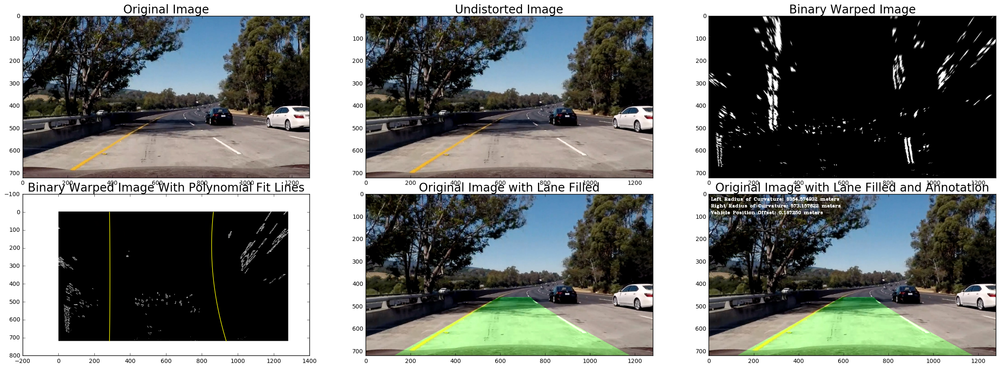

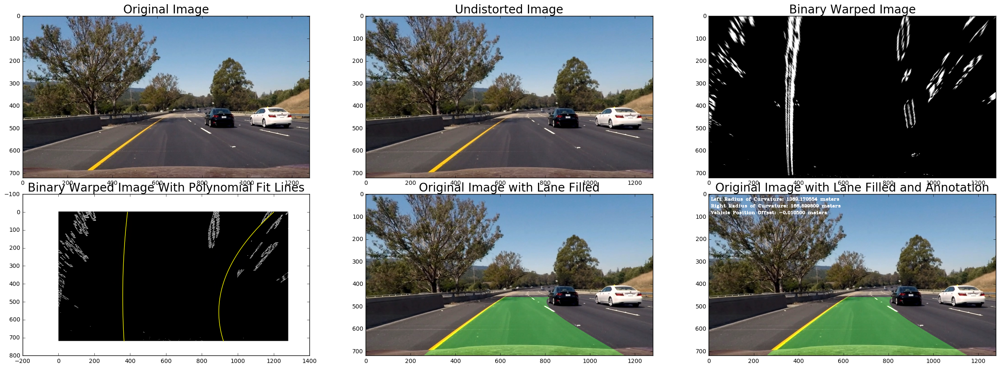

In [84]:
def pipeline(img, plot=False):
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)

    ksize = 9
    binary_warped, Minv = get_binary_warped(undistorted, ksize)
    left_fit, right_fit, polyfit_img, nonzerox, nonzeroy, left_lane_inds, right_lane_inds, leftx_base, rightx_base = find_poly_fit_using_histogram(binary_warped)
    left_fitx, right_fitx, ploty = generate_plotting_values(binary_warped, left_fit, right_fit)

    polyfit_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    polyfit_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
#     plt.imshow(polyfit_img)
#     plt.plot(left_fitx, ploty, color='yellow')
#     plt.plot(right_fitx, ploty, color='yellow')
#     plt.xlim(0, 1280)
#     plt.ylim(720, 0)

    left_curverad, right_curverad = get_radius_of_curvature_in_meters(ploty, left_fitx, right_fitx)
    offset_m = get_offset(img.shape[1], leftx_base, rightx_base)
    
    print(left_curverad, 'm', right_curverad, 'm', offset_m, 'm')
    
    result = draw_lane_zone(img, undistorted, binary_warped, ploty, left_fitx, right_fitx, Minv)

    f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    ax2.set_title('Undistorted Image', fontsize=20)
    ax3.imshow(binary_warped, cmap='gray')
    ax3.set_title('Binary Warped Image', fontsize=20)
    ax4.imshow(polyfit_img, cmap='gray')
    ax4.plot(left_fitx, ploty, color='yellow')
    ax4.plot(right_fitx, ploty, color='yellow')
    ax4.set_title('Binary Warped Image With Polynomial Fit Lines', fontsize=20)
    ax5.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax5.set_title('Original Image with Lane Filled', fontsize=20)
    annotate(result, left_curverad, right_curverad, offset_m)
    ax6.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    ax6.set_title('Original Image with Lane Filled and Annotation', fontsize=20)
    ## TODO: Set Text
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    
test_images = glob.glob('test_images/*.jpg')

for test_image in test_images:
    img = cv2.imread(test_image)
    pipeline(img)

In [ ]:
# Import everything needed to edit/save/watch video clips
# from moviepy.editor import VideoFileClip
# from IPython.display import HTML

# vid_output = 'processed_out.mp4'
# clip1 = VideoFileClip("project_video.mp4")
# final_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
# %time final_clip.write_videofile(vid_output, audio=False)